Установка зависимостей

In [ ]:
%pip install numpy==1.26.2 scikit-learn==1.3.2 matplotlib==3.8.2
%pip install machine-learning-datasets==0.1.23
%pip install pdpbox==0.3.0
%pip install pycebox==0.0.1

Загрузка данных

In [5]:
import machine_learning_datasets as mldatasets

birthorder_df = mldatasets.load("personality-birthorder", prepare=True)
print(birthorder_df.shape)

https://openpsychometrics.org/_rawdata/FBPS-ValidationData.zip downloaded to /Users/user/Projects/python/ai/4/data/FBPS-ValidationData.zip
/Users/user/Projects/python/ai/4/data/FBPS-ValidationData.zip uncompressed to /Users/user/Projects/python/ai/4/data/FBPS-ValidationData
1 dataset files found in /Users/user/Projects/python/ai/4/data/FBPS-ValidationData folder
parsing /Users/user/Projects/python/ai/4/data/FBPS-ValidationData/FBPS-ValidationData/FBPS-ValidationData.csv
(25813, 97)


Подготовка данных

In [6]:
from sklearn.model_selection import train_test_split

rand = 9
y = birthorder_df["birthorder"]
X = birthorder_df.drop(["birthorder"], axis=1).copy()
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=rand
)

Инициализация моделей

In [7]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn import linear_model, tree, discriminant_analysis, ensemble, neural_network

class_models = {
    "decision_tree": {
        "model": tree.DecisionTreeClassifier(
            max_depth=6, random_state=rand, class_weight="balanced"
        )
    },
    "gradient_boosting": {
        "model": ensemble.GradientBoostingClassifier(
            n_estimators=200, max_depth=4, subsample=0.5, learning_rate=0.05
        )
    },
    "random_forest": {
        "model": ensemble.RandomForestClassifier(
            max_depth=11, n_estimators=300, max_features="sqrt", random_state=rand
        )
    },
    "logistic": {
        "model": linear_model.LogisticRegression(
            multi_class="ovr", solver="lbfgs", class_weight="balanced", max_iter=500
        )
    },
    "lda": {"model": discriminant_analysis.LinearDiscriminantAnalysis(n_components=2)},
    "mlp": {
        "model": make_pipeline(
            StandardScaler(),
            neural_network.MLPClassifier(
                hidden_layer_sizes=(11,),
                early_stopping=True,
                random_state=rand,
                validation_fraction=0.25,
                max_iter=500,
            ),
        )
    },
}

Обучение моделей

In [8]:
from sklearn.metrics import (
    accuracy_score,
    recall_score,
    precision_score,
    f1_score,
    matthews_corrcoef,
)

for model_name in class_models.keys():
    print(f"Model: {model_name}")
    fitted_model = class_models[model_name]["model"].fit(X_train, y_train)
    y_train_pred = fitted_model.predict(X_train)
    y_test_pred = fitted_model.predict(X_test)
    class_models[model_name]["fitted"] = fitted_model
    class_models[model_name]["preds"] = y_test_pred
    class_models[model_name]["Accuracy_train"] = accuracy_score(y_train, y_train_pred)
    class_models[model_name]["Accuracy_test"] = accuracy_score(y_test, y_test_pred)
    class_models[model_name]["Recall_train"] = recall_score(
        y_train, y_train_pred, average="weighted"
    )
    class_models[model_name]["Recall_test"] = recall_score(
        y_test, y_test_pred, average="weighted"
    )
    class_models[model_name]["Precision_train"] = precision_score(
        y_train, y_train_pred, average="weighted"
    )
    class_models[model_name]["Precision_test"] = precision_score(
        y_test, y_test_pred, average="weighted"
    )
    class_models[model_name]["F1_test"] = f1_score(
        y_test, y_test_pred, average="weighted"
    )
    class_models[model_name]["MCC_test"] = matthews_corrcoef(y_test, y_test_pred)

Model: decision_tree
Model: gradient_boosting
Model: random_forest
Model: logistic
Model: lda
Model: mlp


Оценка результатов обучения моделей

In [9]:
import pandas as pd

class_metrics = pd.DataFrame.from_dict(class_models, "index")[
    [
        "Accuracy_train",
        "Accuracy_test",
        "Recall_train",
        "Recall_test",
        "Precision_train",
        "Precision_test",
        "F1_test",
        "MCC_test",
    ]
]
with pd.option_context("display.Precision", 3):
    html = (
        class_metrics.sort_values(by="MCC_test", ascending=False)
        .style.background_gradient(
            cmap="plasma",
            low=0.43,
            high=0.63,
            subset=["Accuracy_train", "Accuracy_test"],
        )
        .background_gradient(cmap="viridis", low=0.63, high=0.43, subset=["F1_test"])
    )
html

,Accuracy_train,Accuracy_test,Recall_train,Recall_test,Precision_train,Precision_test,F1_test,MCC_test
decision_tree,0.496704,0.464139,0.496704,0.464139,0.541157,0.493572,0.441380,0.245647
logistic,0.496415,0.493250,0.496415,0.493250,0.498522,0.494360,0.491616,0.231414
gradient_boosting,0.623685,0.491020,0.623685,0.491020,0.635192,0.485271,0.477665,0.223490
mlp,0.522031,0.494424,0.522031,0.494424,0.517411,0.485165,0.480317,0.222783
lda,0.500810,0.492077,0.500810,0.492077,0.499672,0.489145,0.476930,0.201126
random_forest,0.911588,0.483625,0.911588,0.483625,0.920902,0.477702,0.446664,0.197593


Частота отсутствия информации (No information rate, NIR)
Необходимо, чтобы показатели моделей были выше NIR

In [10]:
print("NIR: %.4f" % (y_train[y_train == 1].shape[0] / y_train.shape[0]))

NIR: 0.4215


Оценка важности признаков древовидных моделей

In [11]:
dt_imp_df = pd.DataFrame(
    {
        "name": X_train.columns,
        "dt_imp": class_models["decision_tree"]["fitted"].feature_importances_,
    }
)
gb_imp_df = pd.DataFrame(
    {
        "name": X_train.columns,
        "gb_imp": class_models["gradient_boosting"]["fitted"].feature_importances_,
    }
)
rf_imp_df = pd.DataFrame(
    {
        "name": X_train.columns,
        "rf_imp": class_models["random_forest"]["fitted"].feature_importances_,
    }
)
dt_rank_df = pd.DataFrame(
    {"dt_rank": dt_imp_df["dt_imp"].rank(method="first", ascending=False).astype(int)}
)
gb_rank_df = pd.DataFrame(
    {"gb_rank": gb_imp_df["gb_imp"].rank(method="first", ascending=False).astype(int)}
)
rf_rank_df = pd.DataFrame(
    {"rf_rank": rf_imp_df["rf_imp"].rank(method="first", ascending=False).astype(int)}
)

tree_ranks_df = pd.merge(
    pd.merge(
        pd.concat((dt_imp_df, dt_rank_df), axis=1),
        pd.concat((gb_imp_df, gb_rank_df), axis=1),
        "left",
    ),
    pd.concat((rf_imp_df, rf_rank_df), axis=1),
    "left",
)
tree_ranks_df["avg_rank"] = (
    tree_ranks_df["dt_rank"] + tree_ranks_df["gb_rank"] + tree_ranks_df["rf_rank"]
) / 3
tree_ranks_df.sort_values(by="avg_rank")

,name,dt_imp,dt_rank,gb_imp,gb_rank,rf_imp,rf_rank,avg_rank
28,birthn,0.851533,1,0.369992,1,0.196067,1,1.000000
81,testelapse,0.013708,3,0.034469,2,0.027307,2,2.333333
26,age,0.006679,7,0.033391,3,0.025065,3,4.333333
0,Q1,0.025340,2,0.023239,6,0.016135,6,4.666667
80,introelapse,0.005056,9,0.029301,4,0.022142,5,6.000000
...,...,...,...,...,...,...,...,...
86,gender_other,0.000000,88,0.001677,89,0.000678,94,90.333333
89,country_GB,0.000000,90,0.001230,91,0.002023,91,90.666667
83,gender_undefined,0.000000,87,0.000891,94,0.000241,96,92.333333
90,country_IE,0.000000,91,0.001091,92,0.000577,95,92.666667


Оценка важности признаков логистической регрессии

In [12]:
import numpy as np

print(class_models["logistic"]["fitted"].coef_.shape)

stdv = np.std(X_train, 0)
lr_imp_df = pd.DataFrame(
    {
        "name": X_train.columns,
        "first_coef_norm": class_models["logistic"]["fitted"].coef_[0] * stdv,
        "middle_coef_norm": class_models["logistic"]["fitted"].coef_[1] * stdv,
        "last_coef_norm": class_models["logistic"]["fitted"].coef_[2] * stdv,
    }
).reset_index(drop=True)

class_priors = class_models["lda"]["fitted"].priors_
print(class_priors)

lr_imp_df["coef_weighted_avg"] = (
    (abs(lr_imp_df["first_coef_norm"]) * class_priors[0])
    + (abs(lr_imp_df["middle_coef_norm"]) * class_priors[1])
    + (abs(lr_imp_df["last_coef_norm"]) * class_priors[2])
)

lr_imp_df.sort_values(
    by="coef_weighted_avg", ascending=False
).style.background_gradient(
    cmap="viridis",
    low=-0.1,
    high=0.1,
    subset=["first_coef_norm", "middle_coef_norm", "last_coef_norm"],
)

(3, 96)
[0.42147566 0.23701862 0.34150572]


,name,first_coef_norm,middle_coef_norm,last_coef_norm,coef_weighted_avg
28,birthn,-0.413243,1.354010,-0.406335,0.633863
0,Q1,0.110559,0.022398,-0.149014,0.102796
12,Q13,0.079389,-0.038331,-0.063698,0.064299
15,Q16,0.060195,-0.054048,-0.027473,0.047563
19,Q20,-0.060952,0.050872,0.022710,0.045503
1,Q2,0.019350,-0.080867,0.048791,0.043985
9,Q10,0.049691,-0.018840,-0.045737,0.041029
26,age,0.055234,-0.026153,-0.029113,0.039421
39,EST1,0.049839,-0.062245,-0.002978,0.036776
40,EST2,-0.051426,-0.005720,0.039463,0.036507


Оценка важности признаков LDA

In [14]:
print(class_models["lda"]["fitted"].coef_.shape)

lda_imp_df = pd.DataFrame(
    {
        "name": X_train.columns,
        "first_coef_norm": class_models["lda"]["fitted"].coef_[0] * stdv,
        "middle_coef_norm": class_models["lda"]["fitted"].coef_[1] * stdv,
        "last_coef_norm": class_models["lda"]["fitted"].coef_[2] * stdv,
    }
).reset_index(drop=True)

lda_imp_df["coef_weighted_avg"] = (
    (abs(lda_imp_df["first_coef_norm"]) * class_priors[0])
    + (abs(lda_imp_df["middle_coef_norm"]) * class_priors[1])
    + (abs(lda_imp_df["last_coef_norm"]) * class_priors[2])
)

lda_imp_df.sort_values(
    by="coef_weighted_avg", ascending=False
).style.background_gradient(
    cmap="viridis",
    low=-0.1,
    high=0.1,
    subset=["first_coef_norm", "middle_coef_norm", "last_coef_norm"],
)

(3, 96)


,name,first_coef_norm,middle_coef_norm,last_coef_norm,coef_weighted_avg
28,birthn,-0.315051,1.002922,-0.307242,0.475423
0,Q1,0.090613,-0.012808,-0.102942,0.076382
12,Q13,0.056740,-0.033932,-0.046477,0.047829
51,AGR3,-0.039195,-0.005623,0.052276,0.035705
15,Q16,0.038815,-0.035811,-0.023050,0.032719
6,Q7,-0.004032,0.064381,-0.039707,0.030519
16,Q17,0.035050,-0.009894,-0.036390,0.029545
24,Q25,-0.034672,0.034036,0.019169,0.029227
77,OPN9,-0.033481,0.045381,0.009825,0.028223
19,Q20,-0.030615,0.038022,0.011395,0.025807


Важность признаков в многослойном персептроне

In [15]:
print(class_models['mlp']['fitted'][1].coefs_[0].shape)
print(class_models['mlp']['fitted'][1].coefs_[1].shape)

(96, 11)
(11, 3)


Определение перестановочной важности признаков

In [16]:
from sklearn import inspection

for model_name in class_models.keys():
    print(f"Model: {model_name}")
    fitted_model = class_models[model_name]["fitted"]
    permutation_imp = inspection.permutation_importance(
        fitted_model,
        X_test,
        y_test,
        n_jobs=-1,
        scoring="accuracy",
        n_repeats=8,
        random_state=rand,
    )
    class_models[model_name]["importances_mean"] = permutation_imp.importances_mean

Model: decision_tree
Model: gradient_boosting
Model: random_forest
Model: logistic
Model: lda
Model: mlp


In [17]:
perm_imp_df = pd.DataFrame(
    {
        "name": X_train.columns,
        "dt_imp": class_models["decision_tree"]["importances_mean"],
        "gb_imp": class_models["gradient_boosting"]["importances_mean"],
        "rf_imp": class_models["random_forest"]["importances_mean"],
        "log_imp": class_models["logistic"]["importances_mean"],
        "lda_imp": class_models["lda"]["importances_mean"],
        "mlp_imp": class_models["mlp"]["importances_mean"],
    }
).reset_index(drop=True)

perm_imp_df["avg_imp"] = (
    perm_imp_df["dt_imp"]
    + perm_imp_df["gb_imp"]
    + perm_imp_df["rf_imp"]
    + perm_imp_df["log_imp"]
    + perm_imp_df["lda_imp"]
    + perm_imp_df["mlp_imp"]
) / 6

perm_imp_sorted_df = perm_imp_df.round(5).sort_values(by="avg_imp", ascending=False)
perm_imp_sorted_df.style.background_gradient(
    cmap="viridis_r",
    low=0,
    high=0.2,
    subset=["dt_imp", "gb_imp", "rf_imp", "log_imp", "lda_imp", "mlp_imp"],
)

,name,dt_imp,gb_imp,rf_imp,log_imp,lda_imp,mlp_imp,avg_imp
28,birthn,0.138500,0.105660,0.074610,0.113330,0.083300,0.109310,0.104120
0,Q1,0.008320,0.000010,0.000880,0.008860,0.011400,0.008230,0.006280
26,age,0.001070,0.001380,0.004110,0.001230,-0.000820,0.001580,0.001430
12,Q13,0.000980,-0.002450,0.001670,0.000670,0.004270,0.002830,0.001330
68,CSN10,0.000130,0.001970,-0.001290,0.001500,0.000980,0.003520,0.001130
3,Q4,0.000000,-0.001010,0.002050,0.001940,0.000900,0.002820,0.001120
16,Q17,0.001190,-0.000280,-0.000040,0.002790,0.001800,0.001060,0.001090
77,OPN9,0.000000,0.000760,-0.000290,0.001760,0.002200,0.001450,0.000980
51,AGR3,0.000320,-0.002420,0.000810,0.000910,0.003100,0.002950,0.000940
63,CSN5,0.002040,-0.000290,0.000130,0.001310,0.000920,0.001530,0.000940


Оценка качества моделей без учета признака birthn

In [18]:
print("NIR: %.4f" % (y_train[y_train == 1].shape[0] / y_train.shape[0]))

pd.DataFrame.from_dict(class_models, "index")[
    ["Accuracy_test"]
] - perm_imp_sorted_df.iloc[0, 1:7].to_numpy().reshape((6, 1))

NIR: 0.4215


,Accuracy_test
decision_tree,0.325639
gradient_boosting,0.38536
random_forest,0.409015
logistic,0.37992
lda,0.408777
mlp,0.385114


Частичная зависимость признаков (графики частичной зависимости)

obtain pred_func from the provided model.


  0%|          | 0/5 [00:00<?, ?it/s]

obtain pred_func from the provided model.


  0%|          | 0/6 [00:00<?, ?it/s]

obtain pred_func from the provided model.


  0%|          | 0/6 [00:00<?, ?it/s]

obtain pred_func from the provided model.


  0%|          | 0/10 [00:00<?, ?it/s]

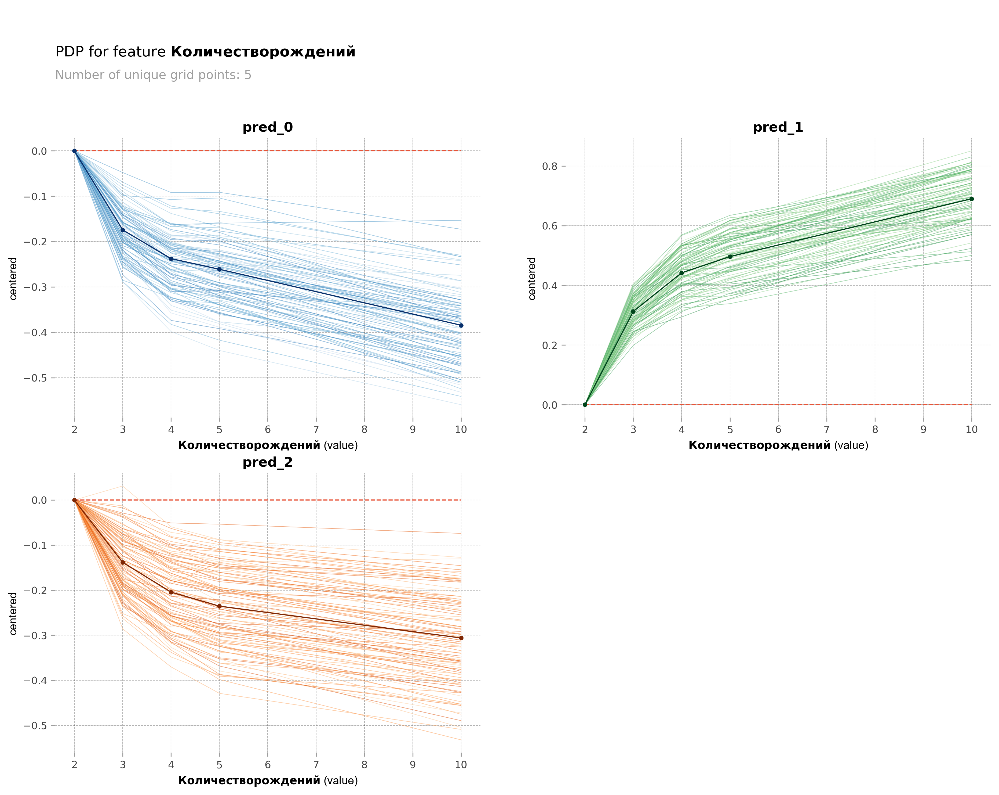

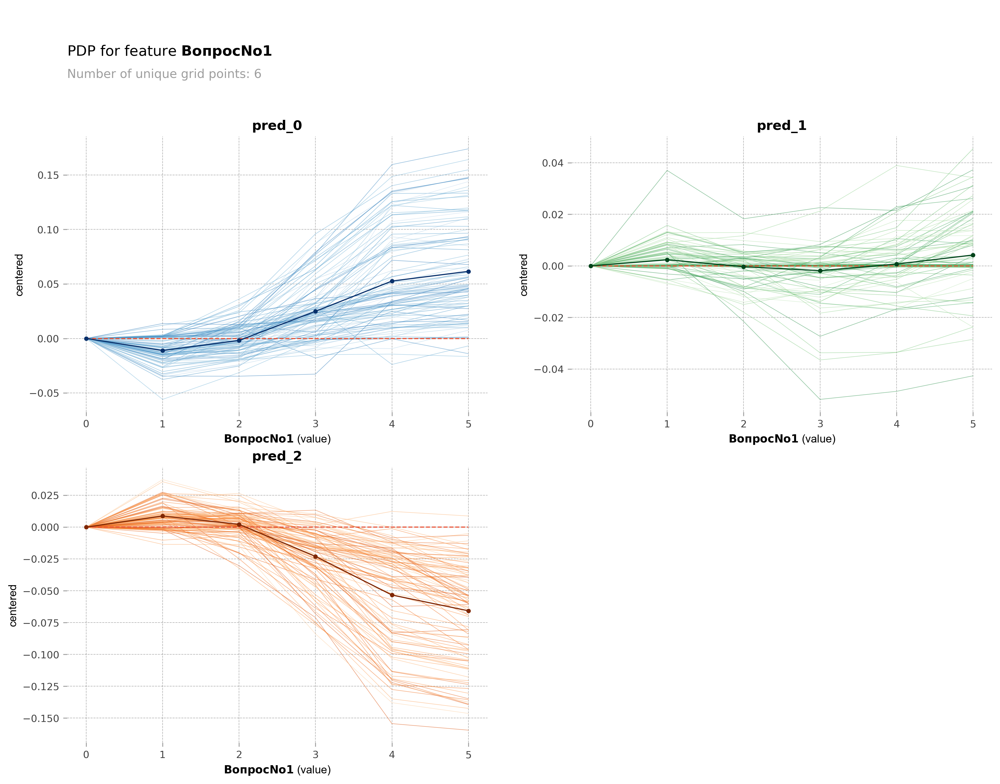

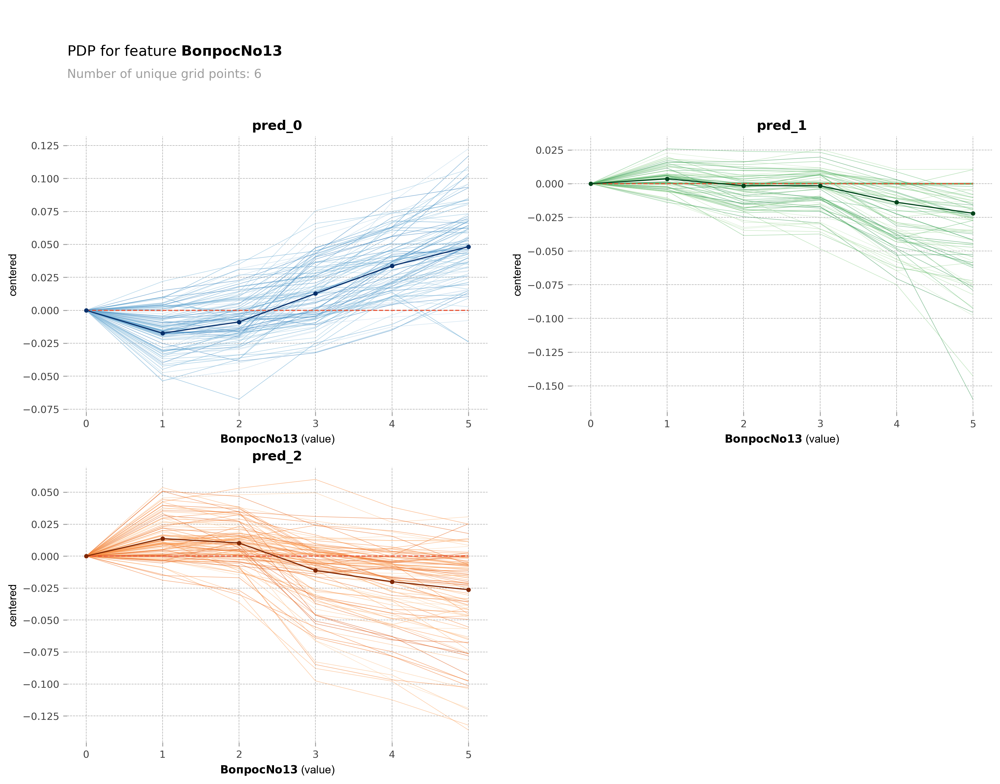

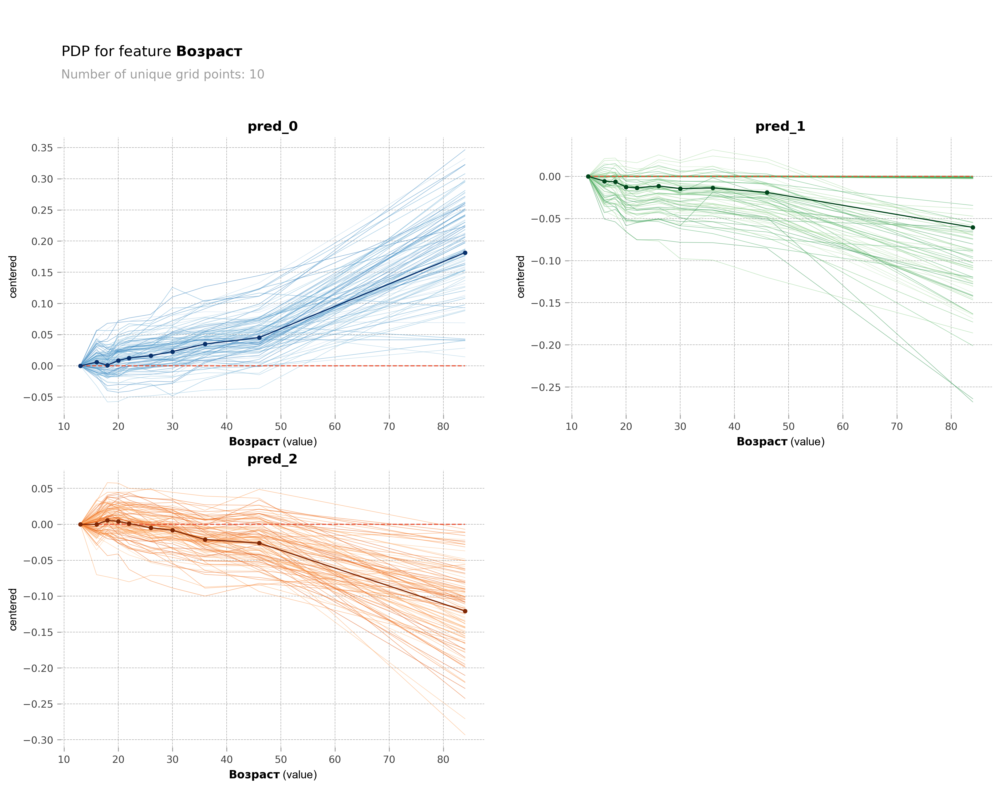

In [19]:
from pdpbox import pdp

feature_names = ["birthn", "Q1", "Q13", "age"]
feature_labels = ["Количество рождений", "Вопрос No 1", "Вопрос No 13", "Возраст"]

for i in range(len(feature_names)):
    pdp_feat_df = pdp.PDPIsolate(
        model=class_models["gradient_boosting"]["fitted"],
        df=pd.concat((X_test, y_test), axis=1),
        model_features=X_test.columns,
        feature=feature_names[i],
        feature_name=feature_labels[i],
        n_jobs=-1,
    )
    fig, axes = pdp_feat_df.plot(
        center=True,
        plot_lines=True,
        show_percentile=True,
        frac_to_plot=100,
        figsize=(15, 6),
        engine="matplotlib",
    )

Распределение по классам с учетом возраста

<Axes: xlabel='age'>

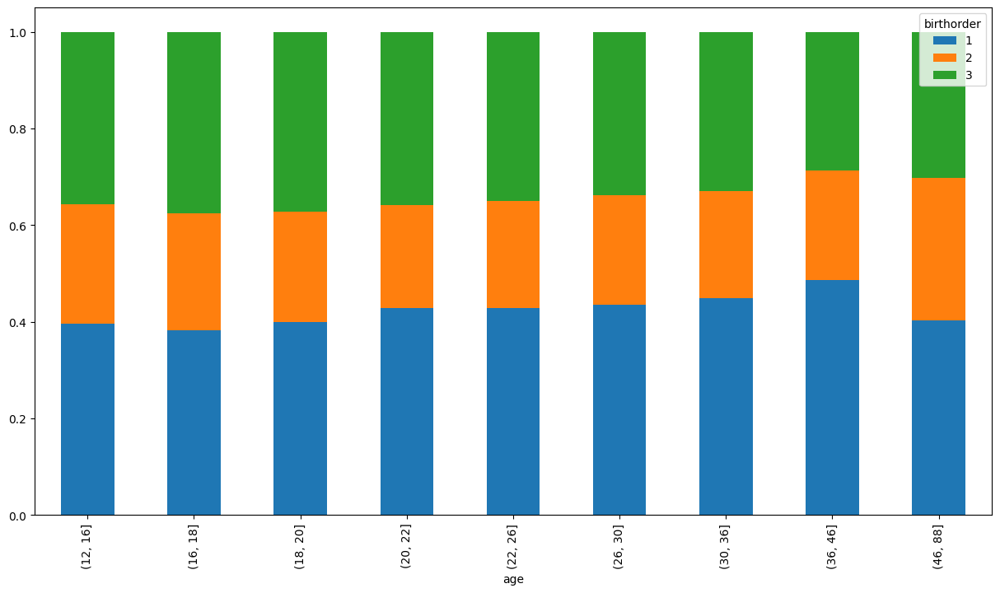

In [20]:
birthorder_abbrev_df = birthorder_df[["age", "birthorder"]]
birthorder_abbrev_df.set_index(
    pd.cut(birthorder_abbrev_df["age"], [12, 16, 18, 20, 22, 26, 30, 36, 46, 88]),
    inplace=True,
)
agegroup_birthorder_counts_s = birthorder_abbrev_df.groupby(
    [birthorder_abbrev_df.index, "birthorder"]
).size()
agegroup_counts_s = birthorder_abbrev_df.groupby(birthorder_abbrev_df.index)[
    "birthorder"
].count()
agegroup_pct_birthorder_s = agegroup_birthorder_counts_s.div(
    agegroup_counts_s, axis=0, level=0
)
agegroup_pct_birthorder_s.unstack().plot.bar(stacked=True, figsize=(15, 8))

Графики индивидуального условного ожидания

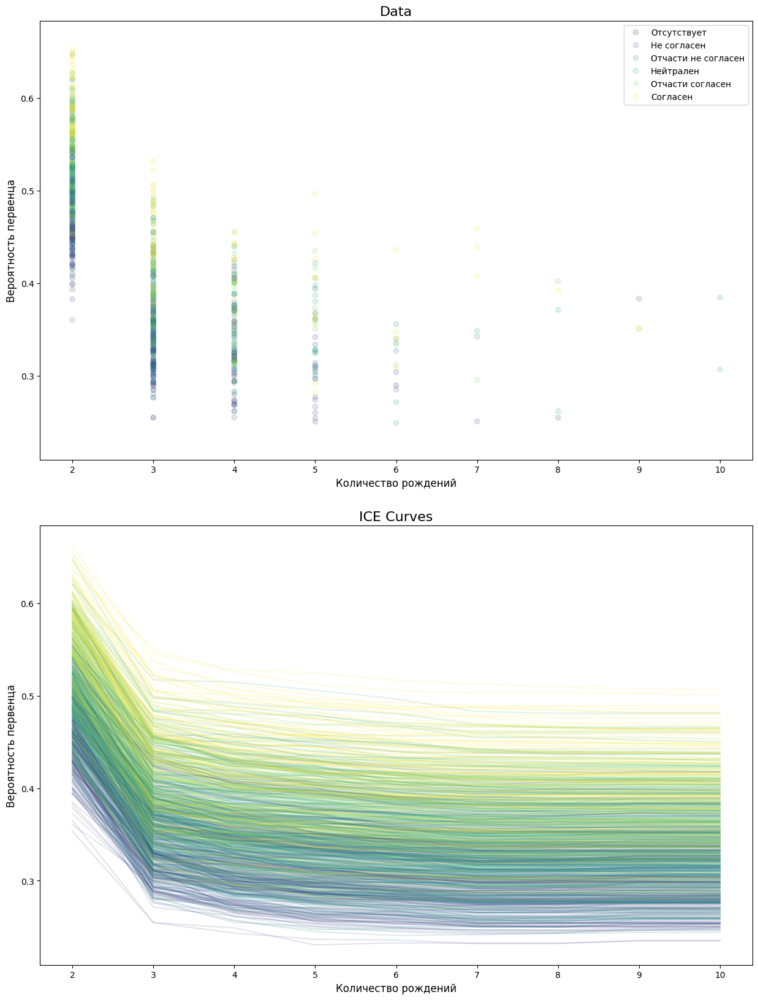

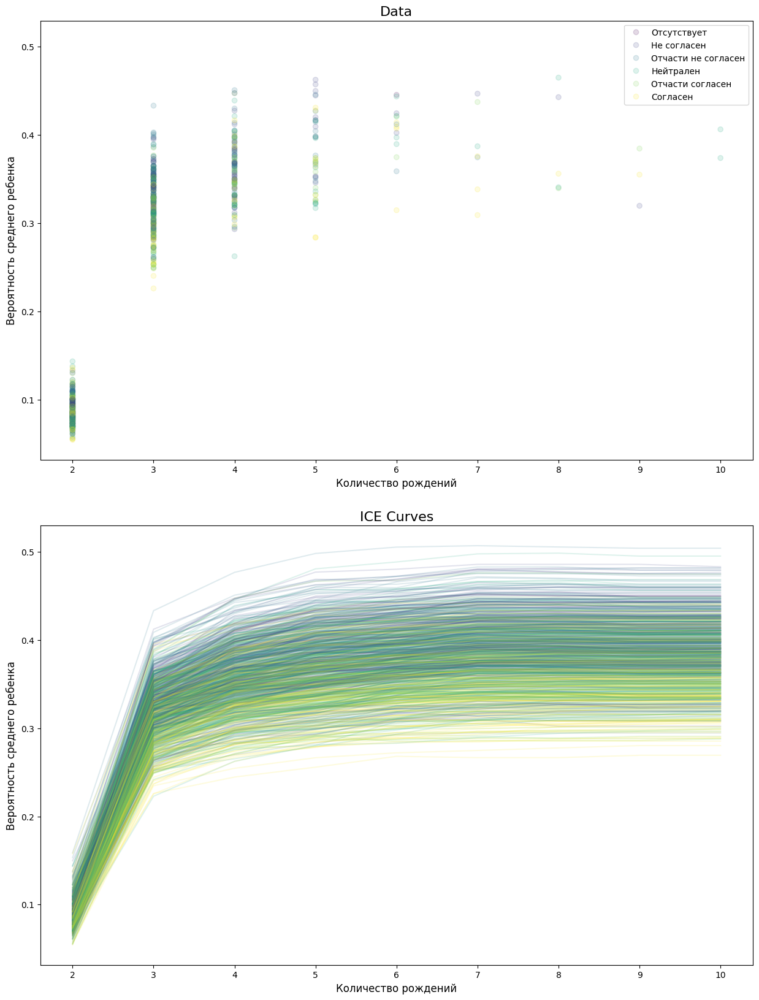

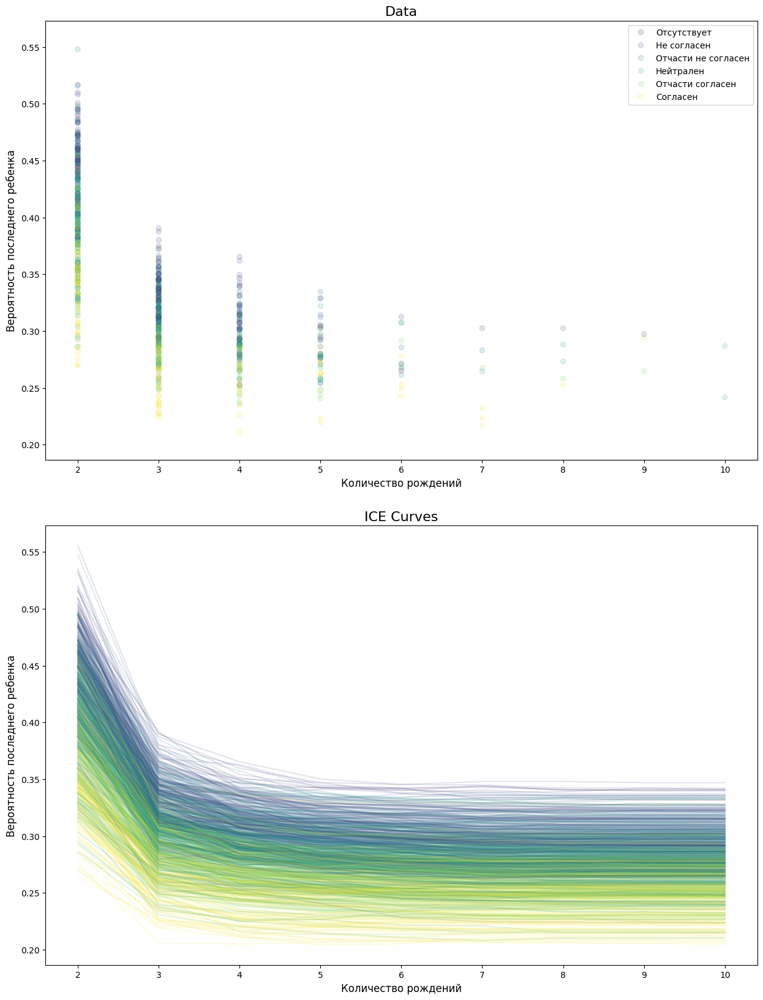

In [22]:
import math
from pycebox.ice import ice, ice_plot
import matplotlib.pyplot as plt

np.random.seed(rand)
sample_size = 0.1
sample_idx = np.random.choice(
    X_test.shape[0], math.ceil(X_test.shape[0] * sample_size), replace=False
)
X_test_samp = X_test.iloc[sample_idx, :]


def predict_prob_first_born(test_df):
    return class_models["random_forest"]["fitted"].predict_proba(test_df)[:, 0]


def predict_prob_middle_child(test_df):
    return class_models["random_forest"]["fitted"].predict_proba(test_df)[:, 1]


def predict_prob_last_born(test_df):
    return class_models["random_forest"]["fitted"].predict_proba(test_df)[:, 2]


def plot_data_vs_ice(
    pred_function,
    ylabel,
    X,
    feature_name,
    feature_label,
    color_by=None,
    legend_key=None,
    alpha=0.15,
):
    ice_df = ice(X, feature_name, pred_function, num_grid_points=None)
    fig, axs = plt.subplots(2, 1, sharex=False, sharey=True, figsize=(15, 20))
    fig.subplots_adjust(hspace=0.15, wspace=0)
    if color_by is None or legend_key is None:
        scatter = axs[0].scatter(X[feature_name], pred_function(X), alpha=alpha)
        ice_plot(ice_df, alpha=alpha, ax=axs[1])
    else:
        scatter = axs[0].scatter(
            X[feature_name], pred_function(X), c=X[color_by], alpha=alpha
        )
        legend = axs[0].legend(*scatter.legend_elements(), loc="best")
        for s in legend_key.keys():
            legend.get_texts()[s].set_text(legend_key[s])
        ice_plot(ice_df, color_by=color_by, alpha=alpha, ax=axs[1])
    axs[0].set_xlabel(feature_label, fontsize=12)
    axs[0].set_ylabel(ylabel, fontsize=12)
    axs[0].set_title("Data", fontsize=16)
    axs[1].set_xlabel(feature_label, fontsize=12)
    axs[1].set_ylabel(ylabel, fontsize=12)
    axs[1].set_title("ICE Curves", fontsize=16)
    plt.show()


legend_key = {
    0: "Отсутствует",
    1: "Не согласен",
    2: "Отчасти не согласен",
    3: "Нейтрален",
    4: "Отчасти согласен",
    5: "Согласен",
}

plot_data_vs_ice(
    predict_prob_first_born,
    "Вероятность первенца",
    X=X_test_samp,
    feature_name="birthn",
    feature_label="Количество рождений",
    color_by="Q1",
    legend_key=legend_key,
)

plot_data_vs_ice(
    predict_prob_middle_child,
    "Вероятность среднего ребенка",
    X=X_test_samp,
    feature_name="birthn",
    feature_label="Количество рождений",
    color_by="Q1",
    legend_key=legend_key,
)

plot_data_vs_ice(
    predict_prob_last_born,
    "Вероятность последнего ребенка",
    X=X_test_samp,
    feature_name="birthn",
    feature_label="Количество рождений",
    color_by="Q1",
    legend_key=legend_key,
)